# Busecke et al. GRL Plots

In [1]:
%load_ext autoreload
%autoreload 2

import warnings
warnings.simplefilter("ignore")

In [2]:
import numpy as np
import xarray as xr
import os
from os.path import join
from scipy.stats import linregress
from dask.diagnostics import ProgressBar
import matplotlib.pyplot as plt
%matplotlib inline
import cartopy.crs as ccrs
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
from xarrayutils.plotting import map_util_plot, axis_arrow, letter_subplots
from xarrayutils.utils import concat_dim_da, aggregate

from busecke_etal_grl_2019_omz_euc.GRL_paper import color_dict, regress_slope, unwrap_CMIP_models, \
    mom_recombine_budgets, compute_residual, scatter_wrapper, below_euc_plot, eof_plot, budget_plot

from busecke_etal_grl_2019_omz_euc.GRL_paper import label_lon_lat_axis, map_gridlines

In [3]:
def save_GRL_plot(fig, name):
    filename = join(plotdir,name)
    print(filename)
    fig.savefig(filename, dpi=600)

In [4]:
levels = 25 # for plotting
plot_roi = dict(st_ocean=slice(0,500), xt_ocean=slice(-220,-80))
plot_roi_euc = dict(xu_ocean=plot_roi['xt_ocean'])
eq_roi = dict(yt_ocean=slice(-1, 1), xt_ocean=slice(-250, -70))

islands = {'Galapagos':-90.3, 'Gilbert Islands': -174.75}

# longitude to 'center' the line plots e.g. thickness
line_mean_target = -170

# parameters for the linear regression (CMIP comparison)
regression_lon = slice(-150, -100) #Further east this might be influenced by the Galapagos, and forther to the west, 
                                   #some of the OMZs (espeacially the observations), drop of sharply.

plotdir = 'GRL_plots/'
if not os.path.exists(plotdir):
    os.mkdir(plotdir)
readdir = '../data' # !!! update to clean. Check all plots and then move to sep repo

# Read in data

In [5]:
# Load in the eq slices
models = ['CM21deg', 'CM26']
cmip = ['CMIP5_piControl', 'CMIP5_rcp85']
obs = ['Bianchi', 'Johnson']
names = models + cmip + obs

ds_eq = dict()
for kk in models + obs:
    ds_eq[kk] =  mom_recombine_budgets(xr.open_dataset(join(readdir,'%s_eq_mean.nc' %kk)))

# add the ENSO indicies    
for kk in ds_eq.keys():
    if 'CM2' in kk:
        path = '../data/%s_%s_climate_indicies_cftime.nc' # moved those files, need to be properly reprocessed
        run = ds_eq[kk].run.data.astype(str)
        enso = xr.open_dataset(path %(kk, run))
        enso.time.data = ds_eq[kk].time.data
        ds_eq[kk]['NINO34'] = enso['NINO3.4']
                                
# average Bianchi obs to longterm mean
ds_eq['Bianchi'] = ds_eq['Bianchi'].mean('month')

euc_shape = dict()
for kk in models + cmip + ['Johnson', 'tao']:
    temp = xr.open_dataset(join(readdir,'%s_euc_shape.nc' %kk))
    if 'xt_ocean' in temp.dims:
        temp = temp.rename({'xt_ocean':'xu_ocean'})
    euc_shape[kk] = temp.sel(**plot_roi_euc)

    # mask euc_shape values based on parameters.
    # Described in paper supp. material. 
    mask_ds = euc_shape[kk]
#     # optional: Mask the euc values only based on mean properties...
#     if 'time' in mask_ds.dims:
#         mask_ds = mask_ds.mean('time')
#     #
    mask = mask_ds.core_value_z > euc_shape[kk].attrs['EUC_boundary'] + 0.1
    
    if 'core_pos_y' in mask_ds.data_vars:
        y_pos_mask = abs(mask_ds.core_pos_y) <= 0.5
        mask = xr.ufuncs.logical_and(mask, y_pos_mask)
    euc_shape[kk] = euc_shape[kk].where(mask)

No `eddy_combined` generated for o2. dummy added.
no budget terms found
no budget terms found


In [6]:
ds_slice = {kk: xr.open_dataset(join(readdir,'%s_depth_slice.nc' %kk)) for kk in models + ['Bianchi']}

omz_shape = {kk: xr.open_dataset(join(readdir,'%s_omz_shape.nc' %kk)) for kk in models + cmip + ['Bianchi']}

ds_lat_slice = {kk: xr.open_dataset(join(readdir,'%s_lat_slice.nc' %kk)) for kk in names}

mom_budget = {kk:xr.open_dataset(join(readdir,'%s_hor_momentum_budget.nc' %kk)) for kk in models}

In [7]:
# EOF stuff
eof_z_vars = ['o2', 'u']
eof_z = {kk:{var:xr.open_dataset(join(readdir, 'single_eof_z_%s_%s.nc' %(var,kk))) for var in eof_z_vars} for kk in models}
mv_eof_z = {kk:{var:xr.open_dataset(join(readdir, 'multi_eof_z_o2_%s_%s.nc' %(var,kk))) for var in eof_z_vars[1:]} for kk in models}

In [8]:
#combine both shape parameters
Shape = dict()
for kk, ds in omz_shape.items():
    if kk in ['Bianchi']:
        omz = ds['depth'].copy()
        euc = euc_shape['Johnson'].lower.copy()
        kk = 'obs'
    else:
        omz = ds['depth'].copy()
        euc = euc_shape[kk].lower.copy()

        if 'time' in ds.dims:
            omz.time.data = euc.time.data # necessary because the loaded files have different calendars.... 
            
    Shape[kk] = xr.Dataset({'OMZ_boundary':omz.rename({'xt_ocean':'xu_ocean'}).interp_like(euc.xu_ocean),
                            'EUC_boundary':euc})

## Chose time for the CMIP runs and combine
Shape = Shape.copy()
control_cut = Shape['CMIP5_piControl'].isel(time=slice(-20,None)) # last 20 years of control run
rcp85_cut = Shape['CMIP5_rcp85'].sel(time=slice('2081','2100')) # explicit 20 years

# combine both datasets with the time from the control
rcp85_cut['time'].data = control_cut.time.data
combo = xr.concat([control_cut, rcp85_cut], dim = concat_dim_da(['piControl', 'rcp85'], 'run'))
Shape['CMIP5'] = combo
del Shape['CMIP5_piControl'], Shape['CMIP5_rcp85']

# Regress all shape parameteres and unwrap the CMIP model array
Shape_regressed = unwrap_CMIP_models({k:regress_slope(v, regression_lon) for k,v in Shape.items()})

No `dtype` chosen. Input is Dataset.         Defaults to float64
No `dtype` chosen. Input is Dataset.         Defaults to float64
No `dtype` chosen. Input is Dataset.         Defaults to float64
No `dtype` chosen. Input is Dataset.         Defaults to float64


# Figures

In [9]:
# AGU compliant version
font = {'weight' : 'light',
        'size'   : 5}
plt.rc('font', **font)
plt.rc('lines',linewidth=0.5)
plt.rc('axes',linewidth=0.5)
plt.rc('axes',titlesize=8)
plt.rc('axes',labelsize=6)
plt.rcParams['xtick.major.size']=1
plt.rcParams['xtick.major.width']=plt.rcParams['axes.linewidth']
plt.rcParams['ytick.major.size']=1
plt.rcParams['ytick.major.width']=plt.rcParams['axes.linewidth']
plt.rcParams['axes.titleweight']='bold'

highlight_lw = 0.75
fullwidth = 190/25.4 # agu full page fig size in inches
halfwidth = fullwidth / 2

In [10]:
co_dict = color_dict()

c_kwargs = dict(levels=[0,80e-6], 
                colors=['None'], 
                hatches=['.....','',],
                yincrease=False,
                add_colorbar=False)
plot_kwargs = dict(robust=True, yincrease=False, cmap=plt.cm.RdBu_r)

outer_u_contour = euc_shape[list(euc_shape.keys())[0]].attrs['EUC_boundary']
c2_kwargs = dict(levels=[outer_u_contour, 0.6, 0.7, 0.8], colors=['0.2', '0.4', '0.6', '0.7'],
                 linestyles=['-', '-', '-', '--'], yincrease=False)

## Figure 1: Motivation

GRL_plots/Motivation.png


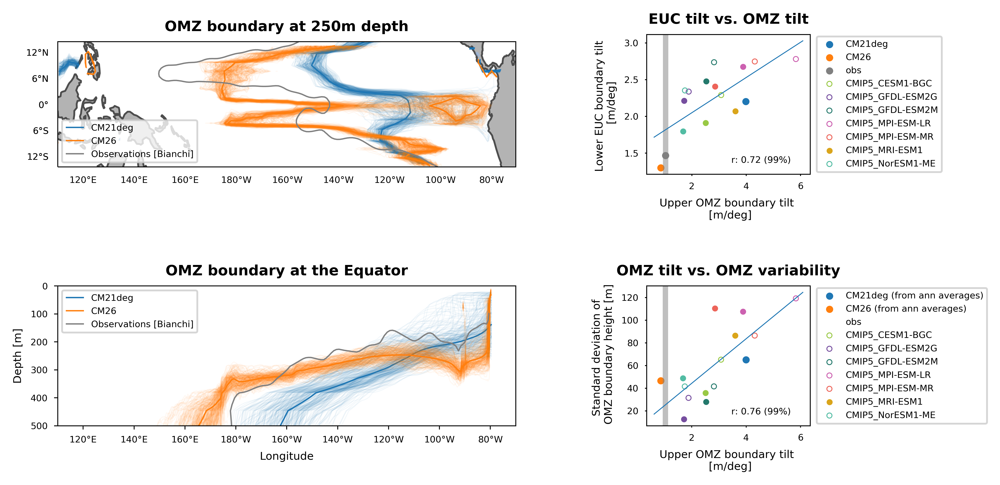

In [11]:
# Create the figure grid
import matplotlib.gridspec as gridspec
fig = plt.figure(figsize=[fullwidth, 4], dpi=600)
gs = gridspec.GridSpec(2, 3, figure=fig, hspace=0.8, wspace=0.8)

ax1 = plt.subplot(gs[0, :-1], projection=ccrs.PlateCarree(-140))
ax2 = plt.subplot(gs[1, :-1])

ax3 = plt.subplot(gs[0, -1])
ax4 = plt.subplot(gs[1, -1])


# Equatorial slice
ax = ax2
leg = []
for kk in ['CM21deg', 'CM26', 'Bianchi']:
    ds = ds_eq[kk]#.sel(**plot_roi)
    sliced_kwargs = dict(ax=ax,levels=[80e-6],x='xt_ocean',y='st_ocean', colors=co_dict[kk],
                          yincrease=False, add_labels=False)
    sliced = ds.o2
    
    if 'time' in ds.dims:
        for tt in sliced.time:
            sliced.sel(time=tt).plot.contour(**sliced_kwargs, alpha=0.05)
        h = sliced.mean('time').plot.contour(**sliced_kwargs, linewidths=highlight_lw)
    elif 'month' in ds.dims:
        h = sliced.mean('month').plot.contour(**sliced_kwargs, linewidths=highlight_lw)
    else:
        h = sliced.plot.contour(**sliced_kwargs, linewidths=highlight_lw)
    leg.append(h)
ax.legend([a.collections[0] for a in leg], models+['Observations [Bianchi]'], loc=2)
ax.set_title('OMZ boundary at the Equator')
ax.set_xlim([eq_roi['xt_ocean'].start, eq_roi['xt_ocean'].stop])
ax.set_ylabel('Depth [m]')
# Label the x axis with proper longitude values...
label_lon_lat_axis(ax, lon=True, axis='x')
ax.set_xlabel('Longitude')
# ax.set_aspect(2)
ax.tick_params(
    axis='both',
    length=2,
)
ax.set_ylim(plot_roi['st_ocean'].stop, plot_roi['st_ocean'].start)

# #### map ##########
ax = ax1
leg = []
for kk in ['CM21deg', 'CM26', 'Bianchi']:
    ds = ds_slice[kk]
    
    # CM26 is already coarsened in the preprocessing. We however need to coarsen both models for a fair 
    # comparison, since CM2.1 has an increased resolution of ~0.4 deg at the equator.
    # In that case we aggregate in 4 x 4 boxes. 
    # I might move this into the preprocessing when other updates to the data are needed. For now this here is fine, 
    # since it is faster than the high res aggregation
    if 'CM21deg' in kk:
            temp = xr.Dataset()
            for var in ds.data_vars:
                with ProgressBar():
                    temp[var] = aggregate(ds[var].chunk({'xt_ocean':100, 'yt_ocean':100}),[('xt_ocean', 2),('yt_ocean',4)])
            ds = temp  
    
    color = co_dict[kk]
    sliced_kwargs = dict(ax=ax,transform=ccrs.PlateCarree(),levels=[80e-6],
                         colors=color, add_labels=False)
    map_roi = dict(yt_ocean=slice(-15, 15), xt_ocean=eq_roi['xt_ocean'])
    sliced = ds.o2.sel(**map_roi) 
    
    if 'time' in ds.dims:
        for tt in sliced.time:
            sliced.sel(time=tt).plot.contour(**sliced_kwargs, alpha=0.05)
        h = sliced.mean('time').plot.contour(**sliced_kwargs, linewidths=highlight_lw)
    elif 'month' in ds.dims:
        h = sliced.mean('month').plot.contour(**sliced_kwargs, linewidths=highlight_lw)
    else:
        h = sliced.plot.contour(**sliced_kwargs, linewidths=highlight_lw)
    leg.append(h)
# ax.set_extent((eq_roi['xt_ocean'].start, eq_roi['xt_ocean'].stop, -15, 15))
ax.set_aspect(1.7)

map_util_plot(ax)

# need to call E and W labels sep for consistent labeling...see (https://github.com/SciTools/cartopy/issues/276)
map_gridlines(ax, range(120,180,20), linewidth=plt.rcParams['axes.linewidth']) 
map_gridlines(ax, range(-180,-60,20), linewidth=plt.rcParams['axes.linewidth']) 
# I would like to have some ticks though...this seems not possible...

ax.set_ylabel('Latitude')
ax.set_xlabel('Longitude')
ax.legend([a.collections[0] for a in leg], models+['Observations [Bianchi]'], loc=3)
ax.set_title('OMZ boundary at %sm depth' %ds.attrs['depth_slice'])


########### fix #############
# scale ax1 exactly as big as ax2 in the x direction, so that labels match up.
pos1 = np.array(ax2.get_position().bounds)
pos2 = np.array(ax1.get_position().bounds)
for i in [0, 2]:
    pos1[i] = pos2[i]
ax2.set_position(pos1)

# also sync up the actual xlim
ax2.set_xlim(eq_roi['xt_ocean'].start, eq_roi['xt_ocean'].stop)


#### scatter plots
scatter_wrapper(Shape_regressed, 'OMZ_boundary', 'EUC_boundary',  'slope', 'slope', 'mean', 'mean', ax3)
ax3.set_title('EUC tilt vs. OMZ tilt')
ax3.set_xlabel('Upper OMZ boundary tilt \n [m/deg]')
ax3.set_ylabel('Lower EUC boundary tilt \n [m/deg]')


scatter_wrapper(Shape_regressed,'OMZ_boundary', 'OMZ_boundary', 'slope', 'intercept', 'mean', 'std', ax4, inverty=False)
ax4.set_title('OMZ tilt vs. OMZ variability')
ax4.set_xlabel('Upper OMZ boundary tilt \n [m/deg]')
ax4.set_ylabel('Standard deviation of \n OMZ boundary height [m]')

save_GRL_plot(fig, 'Motivation.png')

## Figure 2: Lat slices

GRL_plots/EUC_lat_lon.png


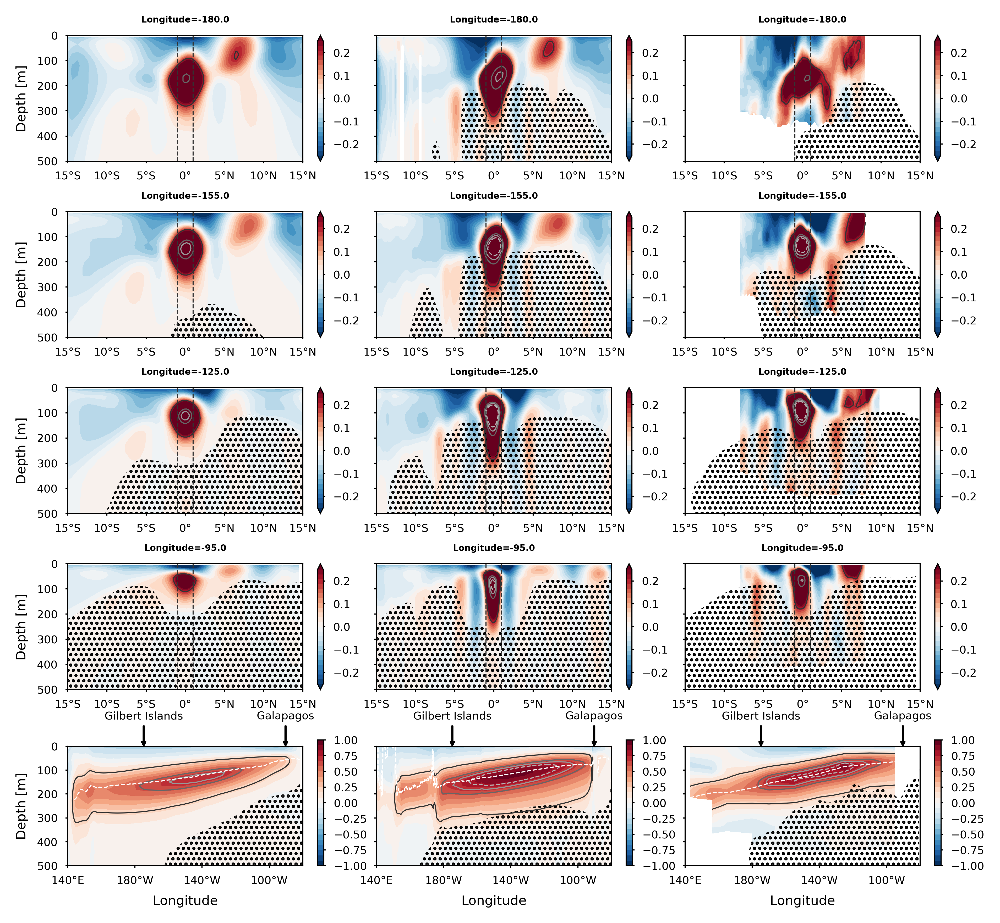

In [12]:
x_slice = ds_lat_slice['Johnson'].xt_ocean[3::2]
y_roi = [-1,1]

fig, axes = plt.subplots(nrows=len(x_slice)+1, ncols=3,
                         figsize=np.array([fullwidth, 1.5*len(x_slice)+1]),
                         dpi=600)

for xi, xx in enumerate(x_slice):
    for source, ax in zip(['CM21deg', 'CM26', 'Johnson'], axes[xi,:]):
        ds = ds_lat_slice[source].copy()
        
        ds = ds.sel(xt_ocean=xx, method='nearest')
        ds_bianchi = ds_lat_slice['Bianchi'].sel(xt_ocean=xx, method='nearest')
        
        plot_kwargs['vmax'] = 0.25

        ds_plot = ds['u']
        if source == 'Johnson':
            ds_cont = ds_bianchi['o2']
        else:
            ds_cont = ds['o2']
        
        if 'time' in ds.dims:
            ds_plot = ds_plot.mean('time')
            ds_cont = ds_cont.mean('time')
        ds_plot = ds_plot.load()
        
        cbar_kwargs={
            'ticks': np.arange(-0.3, 0.4, 0.1),
#              'label': 'Zonal velocity [$ms^{-1}$]'
            'label': ''
                    }
        
        pp = ds_plot.plot.contourf(ax=ax,levels=levels,
                                  cbar_kwargs=cbar_kwargs,**plot_kwargs)
        ds_plot.plot.contour(ax=ax, **c2_kwargs)
        ds_cont.plot.contourf(ax=ax, **c_kwargs)
        ax.set_xlim([-15,15])
        ax.set_ylim(plot_roi['st_ocean'].stop, plot_roi['st_ocean'].start)
        ax.set_title('Longitude=%s' %xx.data)
        label_lon_lat_axis(ax, lon=False, axis='x')
        ax.set_xlabel('')
        roi_kwargs = dict(color='0.2', linewidth=0.5, linestyle='--')
        ax.axvline(y_roi[0], **roi_kwargs)
        ax.axvline(y_roi[1], **roi_kwargs)


for source, ax in zip(['CM21deg', 'CM26', 'obs'], axes[-1,:]):
    
    if source == 'obs':
        ds_u = ds_eq['Johnson'].u.copy()
        ds_o2 = ds_eq['Bianchi'].o2.copy()
        ds_euc = euc_shape['Johnson'].copy()
    else:
        ds_u = ds_eq[source].u.copy()
        ds_o2 = ds_eq[source].o2.copy()
        ds_euc = euc_shape[source].copy()
    

    def pre(ds):
        ds = ds.copy()

        if 'time' in ds.dims:
            ds = ds.mean('time')
            
        if 'month' in ds.dims:
            ds = ds.mean('month')
        return ds

    ds_plot = pre(ds_u)
    ds_cont = pre(ds_o2)
    ds_cont2 = pre(ds_u)
    ds_line = pre(ds_euc)
    
    

    plot_kwargs['vmax'] = 1

    ds_plot.plot.contourf(ax=ax,levels=levels, 
                                        cbar_kwargs={
#                                             'label': 'u [$ms^{-1}$]'
                                            'label': ''
                                        },
                                        **plot_kwargs)
    ds_cont.plot.contourf(ax=ax, **c_kwargs)
    ds_cont2.plot.contour(ax=ax, **c2_kwargs)

    # draw position of measurements in obs plot
    if source == 'Johnson':
        for jx in ds.u.attrs['Johnson_xt_positions']:
            ax.axvline(jx, linestyle='--', linewidth=0.5, color='0.5')

    # indicate important islands
    arrow_dict = dict(width=plt.rcParams['lines.linewidth'],
                      headwidth=2,
                      headlength=2,
                      lw=plt.rcParams['lines.linewidth']
                     )
    [axis_arrow(ax, is_lon, is_name, arrowprops=arrow_dict) for is_name, is_lon in islands.items()]
    
    mask = ds_line.core_value_z > c2_kwargs['levels'][0] + 0.1
    
    ds_line.core_pos_z.where(mask).plot(x='xu_ocean', ax=ax, linestyle='--', color='w', yincrease=False)
    
    ax.set_xlim(plot_roi['xt_ocean'].start, plot_roi['xt_ocean'].stop)
    ax.set_ylim(plot_roi['st_ocean'].stop, plot_roi['st_ocean'].start)


##### for the lat axes
for ax in axes[:-1, :].flat:
    ax.set_title(ax.get_title(), fontsize=4)

for ax in axes[:,1:].flat:
    ax.set_ylabel('')
    ax.tick_params(labelleft=False)
    
for ax in axes[:,0].flat:
    ax.set_ylabel('Depth [m]')

# For the lon axes
for ax in axes[-1,1:].flat:
    ax.set_ylabel('')
    # turn of ticklabels
    ax.tick_params(labelleft=False)
    
for ax in axes[-1,:].flat:
    ax.set_title('')
    ax.set_xlabel('Longitude')
    ax.set_xticks(np.arange(-220, -60, 40))
    label_lon_lat_axis(ax, lon=True, axis='x')
    
fig.subplots_adjust(wspace=0.05, hspace=0.4)

for ax in axes[-1,:].flat:
    # squish the longtitude sections to make room for the arrows
    pos = np.array(ax.get_position().bounds)
    pos[3] = pos[3] * 0.95
    ax.set_position(pos)


save_GRL_plot(fig, 'EUC_lat_lon.png')

## Budget Plots

GRL_plots/Budget_o2_tendency_mean.png
GRL_plots/Budget_o2_advection_recon_mean.png
GRL_plots/Budget_o2_advection_eddy_recon_mean.png
GRL_plots/Budget_o2_submeso_mean.png
GRL_plots/Budget_o2_eddy_combined_mean.png
GRL_plots/Budget_o2_vertical_diff_mean.png
GRL_plots/Budget_jo2_mean.png
GRL_plots/Budget_residual_mean.png
GRL_plots/Budget_o2_tendency_std.png
GRL_plots/Budget_o2_advection_recon_std.png
GRL_plots/Budget_o2_advection_eddy_recon_std.png
GRL_plots/Budget_o2_submeso_std.png
GRL_plots/Budget_o2_eddy_combined_std.png
GRL_plots/Budget_o2_vertical_diff_std.png
GRL_plots/Budget_jo2_std.png
GRL_plots/Budget_residual_std.png
GRL_plots/Budget_o2_advection_recon_w_diff_mean.png


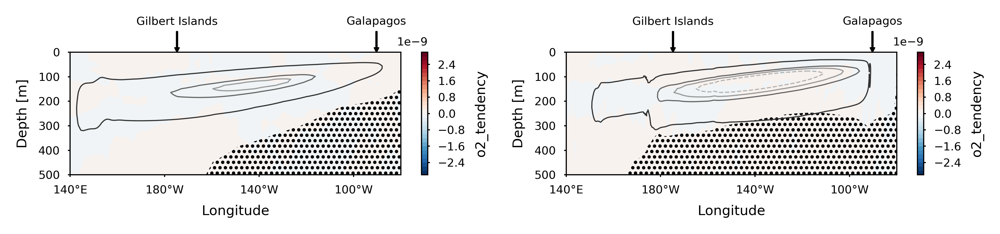

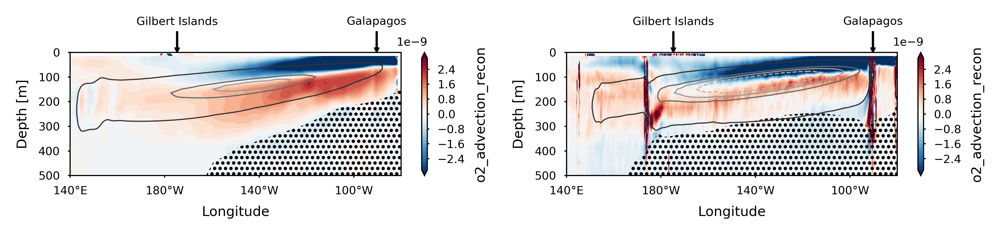

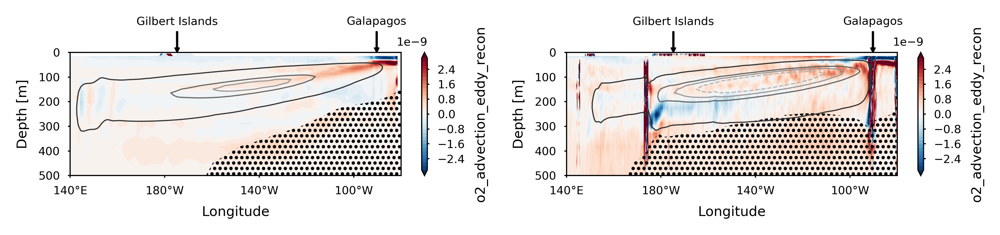

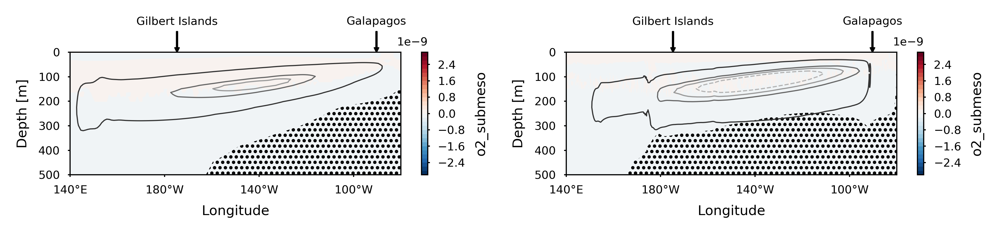

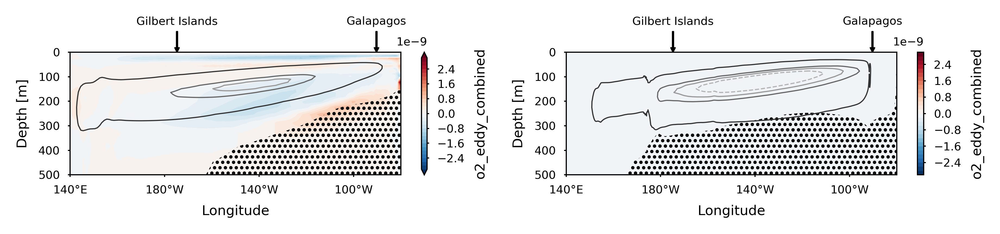

...

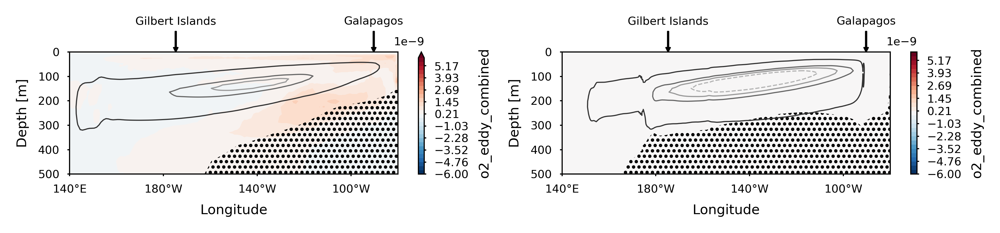

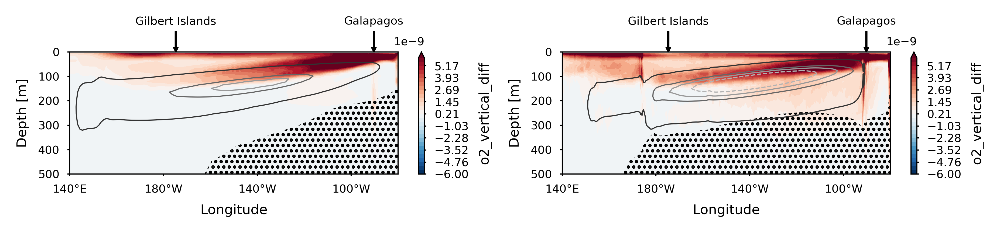

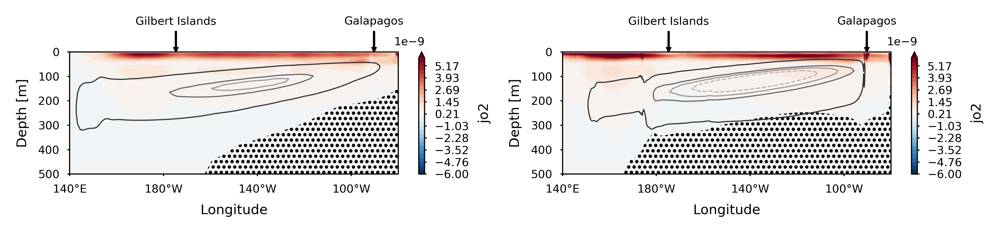

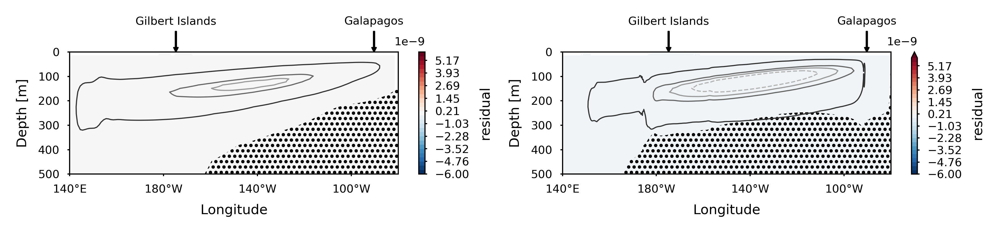

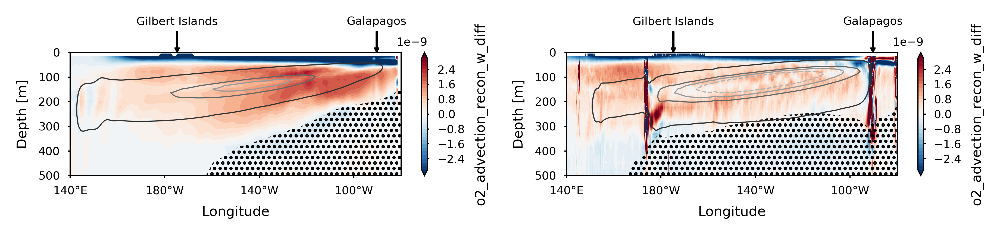

In [13]:
varlist = [
    'o2_tendency',
    'o2_advection_recon',
    'o2_advection_eddy_recon',
    'o2_submeso',
    'o2_eddy_combined',
    'o2_vertical_diff',
    'jo2',
    'residual',
          ]
args = (plot_kwargs, c_kwargs, c2_kwargs, islands, plot_roi, varlist) # this is pretty clunky
for metric in ['mean', 'std']:
    for var in varlist:
        fig = budget_plot(ds_eq, var, metric, *args)
        save_GRL_plot(fig, 'Budget_%s_%s.png' %(var, metric))

# extra plot of reconstructed advection + vert_diff
var = 'o2_advection_recon_w_diff'
metric = 'mean'
fig = budget_plot(ds_eq, var, metric,  *args)
save_GRL_plot(fig, 'Budget_%s_%s.png' %(var, metric))

## Momentum budget plots

GRL_plots/Momentum_budget_CM26.png


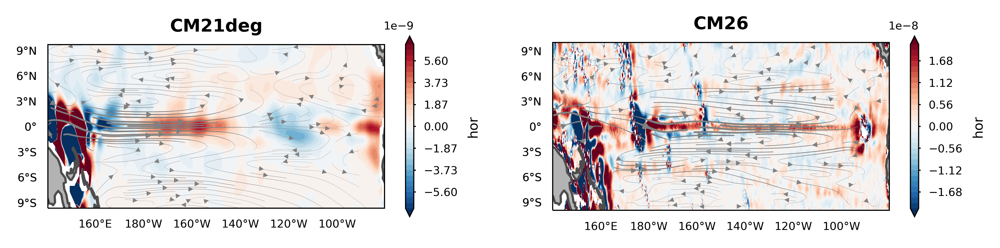

In [14]:
fig, axarr = plt.subplots(figsize=[fullwidth, 1.5], ncols=2, dpi=600, subplot_kw={'projection':ccrs.PlateCarree(-140)})
for mod, ax in zip(models, axarr):
    a = mom_budget[mod]
    a = a.sel(xt_ocean = plot_roi['xt_ocean'])
    dens = np.array([1.5, 5.5])/2.5
    
    vmax = 7e-9
    if mod == 'CM26':
        vmax = vmax * 3
    a['hor'].plot.contourf(ax=ax, levels=31,robust=True, transform=ccrs.PlateCarree(), vmax=vmax)
    magnitude = (a.u.data ** 2 + a.v.data ** 2) ** 0.5
    
    xx, yy = np.meshgrid(a.xu_ocean, a.yu_ocean)
    ax.streamplot(xx, yy, a.u.data, a.v.data, transform=ccrs.PlateCarree(), density=dens,
                  color='0.5', linewidth=magnitude*3.75+0.05, arrowsize=1/2, )
    ax.set_aspect(3.5)
    map_util_plot(ax)

    # need to call E and W labels sep for consistent labeling...see (https://github.com/SciTools/cartopy/issues/276)
    map_gridlines(ax, range(160,180,20), linewidth=plt.rcParams['axes.linewidth']) 
    map_gridlines(ax, range(-180,-80,20), linewidth=plt.rcParams['axes.linewidth']) 
    ax.set_title(mod)
    ax.set_ylabel('Latitude')
    ax.set_xlabel('Longitude')
save_GRL_plot(fig, 'Momentum_budget_%s.png' %mod)

## EOF Plots

- The year 2000 correcponds to the year 0. This was a correction I made before cftime was properly integrated to xarray. It is later removed in Illustrator.

CM21deg
GRL_plots/EOF_z_single_o2_CM21deg.png
GRL_plots/EOF_z_single_u_CM21deg.png
CM26
GRL_plots/EOF_z_single_o2_CM26.png
GRL_plots/EOF_z_single_u_CM26.png


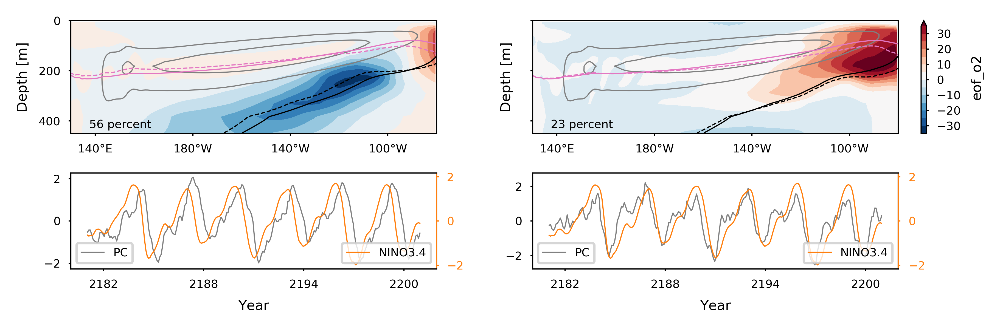

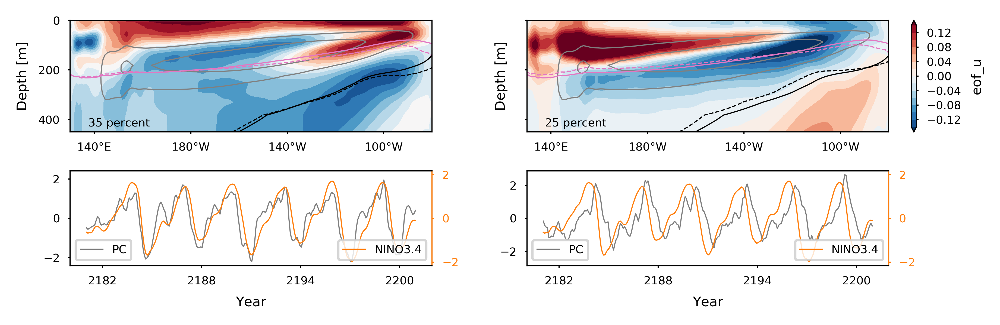

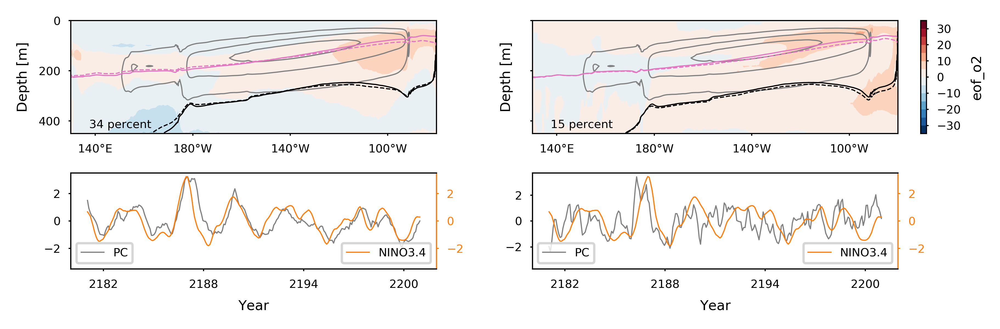

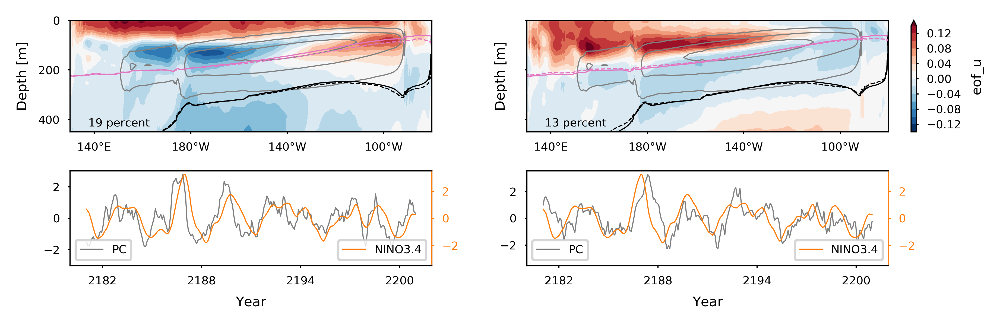

In [15]:
budget_vmax = 1e-7
var_plot_kwargs = {'o2': {'vmax':35, 'yincrease':False, 'x':'xt_ocean'},
                    'u': {'vmax':0.14, 'yincrease':False, 'x':'xt_ocean'},
                  }


for kk, ds in  eof_z.items():
    print(kk)
    for var in eof_z_vars:
        args = (ds[var].isel(mode=[0,1]), ds_eq[kk])

        if 'CM26' in kk:
            args = list(args)
            #reverse signs of the modes to enable better comparison
            args[0] = -args[0]
            args = tuple(args)

        fig, axarr = eof_plot(*args, var_plot_kwargs=var_plot_kwargs)
        for ax in axarr[0:-1,:].flat:
            ax.set_ylim(450,0)
            ax.set_xlim(-230, -80)

        save_GRL_plot(fig, 'EOF_z_single_%s_%s.png' %(var, kk))

GRL_plots/EOF_z_multi_o2_u_CM21deg.png
GRL_plots/EOF_z_multi_o2_u_CM26.png


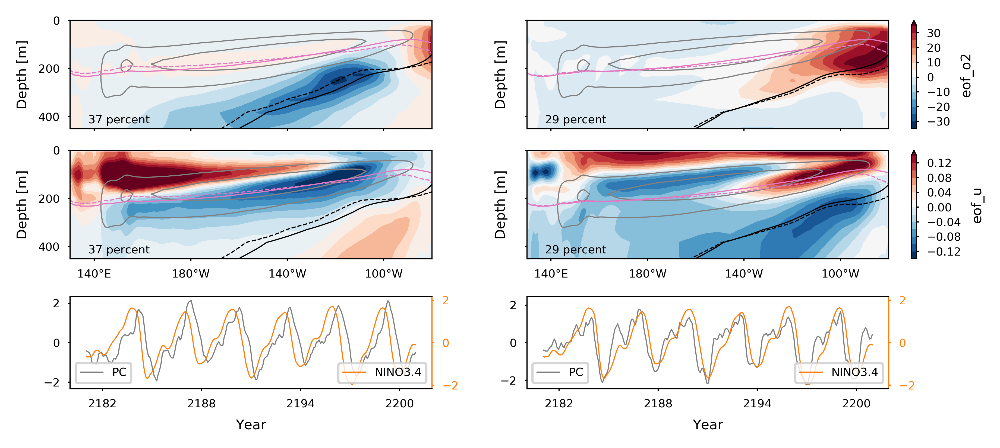

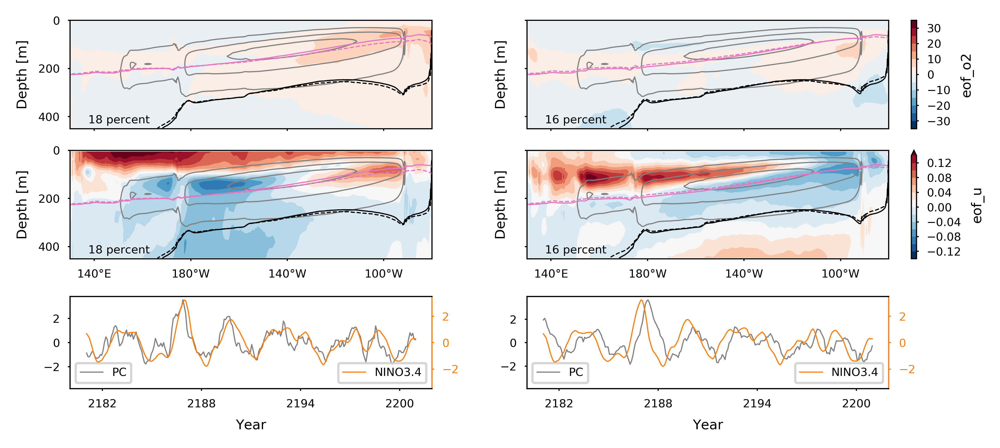

In [16]:
for var in eof_z_vars[1:]:
    for kk, ds in  mv_eof_z.items():
        args = (ds[var].isel(mode=[0,1]), ds_eq[kk])

        if 'CM26' in kk:
            args = list(args)
            #reverse signs of the modes to enable better comparison
            args[0] = -args[0]
            args = tuple(args)

        fig, axarr = eof_plot(*args, var_plot_kwargs=var_plot_kwargs)
        for ax in axarr[0:-1,:].flat:
            ax.set_ylim(450,0)
            ax.set_xlim(-230, -80)
        save_GRL_plot(fig, 'EOF_z_multi_o2_%s_%s.png' %(var,kk))

# Appendix Plots

NorESM1-ME
CESM1-BGC
MPI-ESM-LR
GFDL-ESM2M
MRI-ESM1
IPSL-CM5A-LR
GFDL-ESM2G
MPI-ESM-MR
GRL_plots/CMIP_OMZ.png


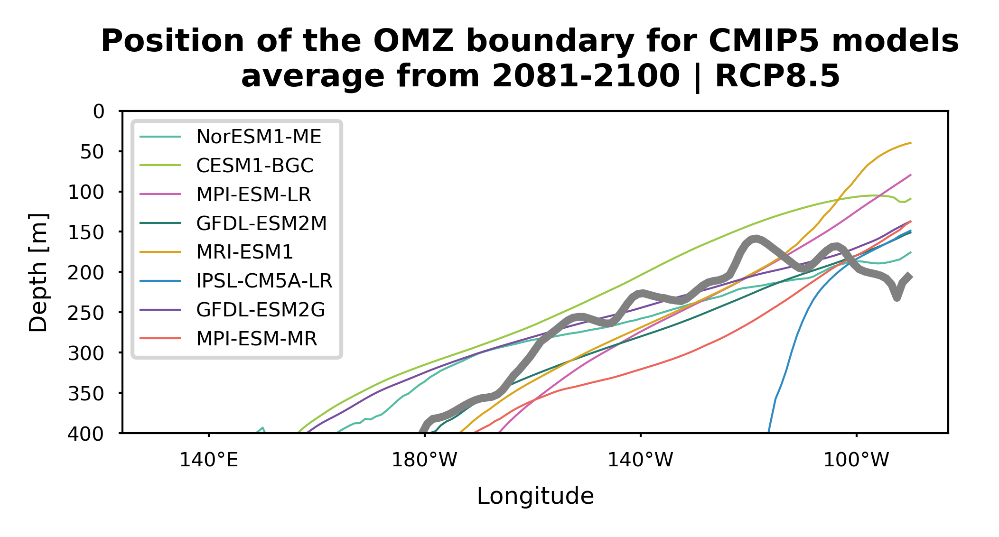

In [17]:
fig, ax = plt.subplots(figsize=[halfwidth,1.5], dpi=600)
data = omz_shape['CMIP5_rcp85'].depth
for mm in data.model.data:
    print(mm)
    data.sel(model=mm).mean('time').plot(color=co_dict[mm], yincrease=False, label=mm)
omz_shape['Bianchi'].depth.plot(color=co_dict['Bianchi'], yincrease=False, linewidth=2)
plt.legend()
plt.title('Position of the OMZ boundary for CMIP5 models \n average from 2081-2100 | RCP8.5')
plt.xlabel('Longitude')
plt.ylabel('Depth [m]')
plt.gca().set_ylim(400,0)
# set less ticks
ax.set_xticks(np.arange(-220, -60, 40))
label_lon_lat_axis(ax, lon=True, axis='x')

save_GRL_plot(fig, 'CMIP_OMZ.png')

In [18]:
# this should really be done in the processing...
def compute_additional_metrics(ds):
    ds = ds.copy()
    ds['upper_thickness'] = ds['core_pos_z'] - ds['upper']
    ds['lower_thickness'] = ds['lower'] - ds['core_pos_z']
    return ds

def rename_shape(ds):
    ds = ds.copy()
    rename_dict = {'core_pos_z':'EUC core', 'thickness':'Thickness', 'upper_thickness':'Upper Thickness',
                   'lower_thickness':'Lower Thickness', 'upper':'Upper EUC Boundary', 'lower':'Lower EUC Boundary'}
    return ds.rename(rename_dict)

def add_shape_units(ds):
    ds = ds.copy()
    for var in ds.data_vars:
        ds[var].attrs['units'] = 'm'
    return rename_shape(ds)

GRL_plots/EUC_Parameters_main_(mean_@-170_removed).png
GRL_plots/EUC_Parameters_main_.png


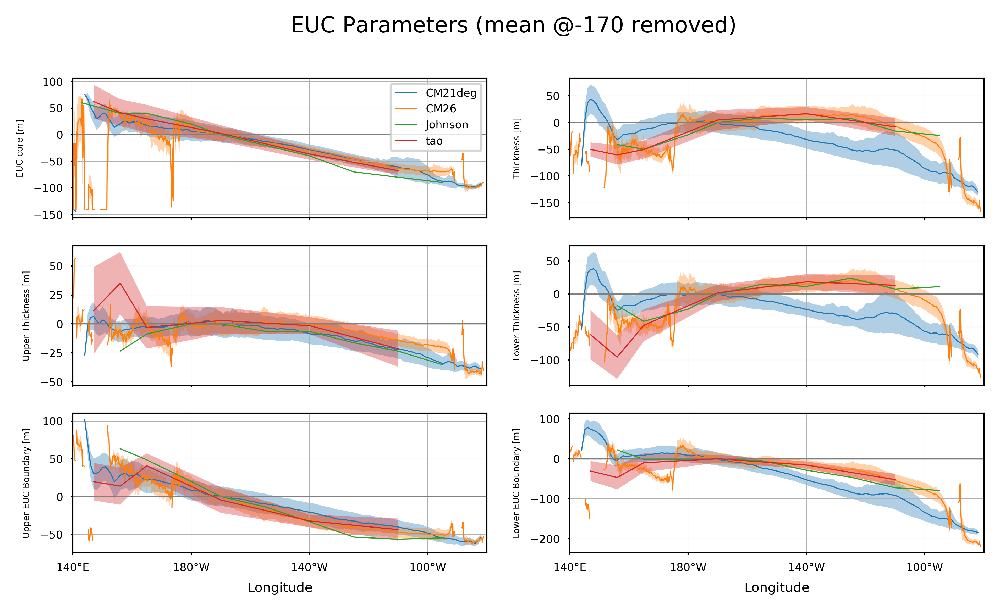

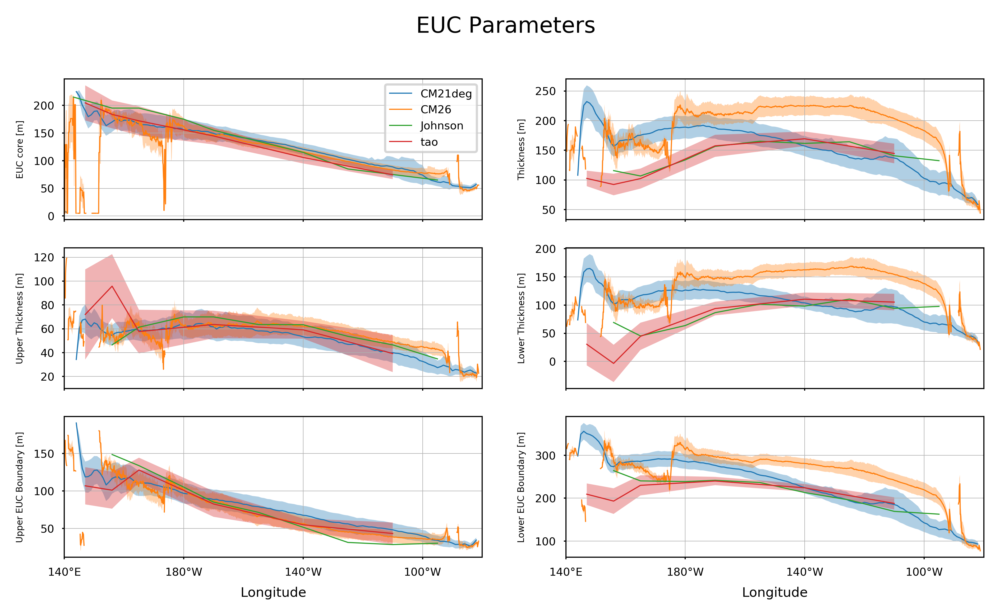

In [19]:
from xarrayutils.plotting import plot_line_shaded_std
# plot_vars = ['core_pos_z', 'thickness', 'upper_thickness', 'lower_thickness', 'upper', 'lower']
plot_vars = ['EUC core', 'Thickness', 'Upper Thickness', 'Lower Thickness', 'Upper EUC Boundary', 'Lower EUC Boundary']
aa = {k:add_shape_units(compute_additional_metrics(v)) for k,v in euc_shape.items()}
del aa['CMIP5_piControl']
del aa['CMIP5_rcp85']

for remove_mean in [True, False]:
    fig, axarr = plt.subplots(nrows=3, ncols=2, figsize=[fullwidth, 4], dpi=600)
#     fig, axarr = plt.subplots(nrows=3, ncols=2, figsize=np.array([10,4])*2)

    for kk, ds in aa.items():
        ds = ds.sel(xu_ocean=slice(-220, -80))
        with xr.set_options(keep_attrs=True):
            if remove_mean:
                if 'time' in ds.dims:
                    ds = ds - ds.interp(xu_ocean=line_mean_target).mean('time')
                else:
                    ds = ds - ds.interp(xu_ocean=line_mean_target)
                titadd = '(mean @%s removed)' %line_mean_target
            else:
                titadd = ''

        for ax, var in zip(axarr.flat, plot_vars):
            plot_kwargs = dict(label=kk)
            plot_ds = ds[var].squeeze()
            
#             if 'run' in plot_ds.dims:
#                 plot_ds = plot_ds.sel(run=b'control')
            
            if remove_mean:
                ax.axhline(0, color='0.5')

            if 'time' in plot_ds.dims:
                h = plot_line_shaded_std(plot_ds.xu_ocean, plot_ds.mean('time'), plot_ds.std('time')/2, ax=ax, line_kwargs=plot_kwargs)
            else:
                h = plot_ds.plot(ax=ax, **plot_kwargs)
            #
            ax.set_xlim(plot_roi['xt_ocean'].start, plot_roi['xt_ocean'].stop)
            ax.grid(which='major', linewidth=0.25)
            ax.set_xticks(np.arange(-220, -60, 40))
            ax.set_ylabel(ax.get_ylabel(), fontsize=4)
        
        for ax in axarr[:-1,:].flat:
            ax.tick_params(labelbottom=False)
            ax.set_xlabel('')
            
        for ax in axarr[-1,:]:
            label_lon_lat_axis(ax, lon=True, axis='x')
            ax.set_xlabel('Longitude')


    axarr.flat[0].legend()

    fig.suptitle('EUC Parameters %s' %titadd, fontsize=10)
    save_GRL_plot(fig, 'EUC_Parameters_main_%s.png' %titadd.replace(' ','_'))

GRL_plots/Budget_detail_CM21deg.png
GRL_plots/Budget_detail_CM26.png


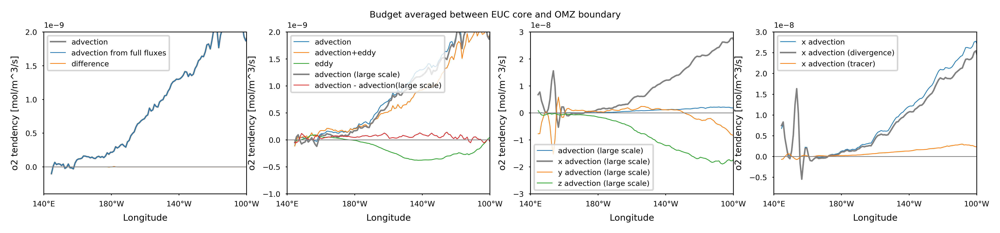

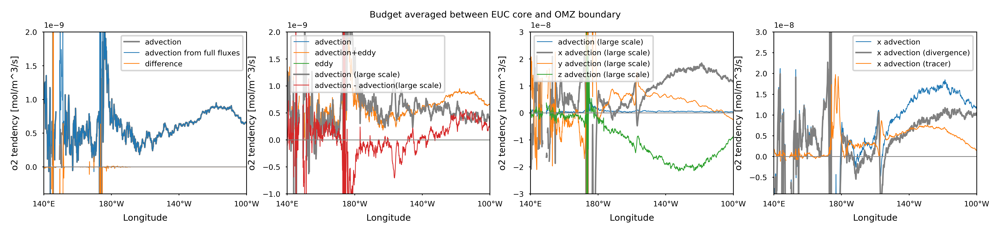

In [20]:
for kk in ['CM21deg', 'CM26']:
    full_ds = ds_eq[kk]
    full_ds = full_ds.chunk({'time':1})
    
    shape_ds = euc_shape[kk]
    shape_ds = shape_ds.interp(xu_ocean=full_ds.xt_ocean.data).rename({'xu_ocean':'xt_ocean'})
    
    fig = below_euc_plot(full_ds, shape_ds)
    fig.suptitle('Budget averaged between EUC core and OMZ boundary')
    save_GRL_plot(fig, 'Budget_detail_%s.png' %kk)